# Trends in Forest Ecology and Succession at Howland Forest

#### MnM4SDS Final Project by Jamis Bruening

##  Original objectives

1. Use exploratory techniques to identify spatial trends in ecological variables 
2. Employ SDS methods to explain presence and drivers of trends
3. _Determine relationship between spatial ecological trends and additional environmental (site) variables, such as temperature, soil moisture, topography._

## Original analysis plan

1. **ESDA – spatial autocorrelation in environmental data (Species composition, physical structure)**
2. ~~Age~~ **Successional related trends in space**
3. ~~Climate related trends (pending data availability)~~
4. **Geographically Weighted Regression**

## Data used and methods employed

### Data sources
1. **Measurements collected in 1989 and 2016**
2. **Tree position (xy), height, DBH**
3. ~~10% of trees cored,~~ **canopy projection area**
4. ~~Soil moisture data (25m res)~~
5. ~~Sapling data in 2016~~
6. ~~GEDI calval site (LiDAR data)~~
7. ~~Oldest phenocam timeseries in network~~

### Methods

1. Exploratory Plotting  
 1.1 Multi-dimensional plotting to visualize ecological variables in space  
 1.2 Regular aspatial exploratory plotting of variables between catagorical groups
 1.3 Aggregated point variables into 5m by 5m grid to smooth out ecological processes

2. Exploratory modeling of successional status as a function of tree geometry  
2.1 **Aspatial:** Predicted successional status as a function of tree height, diameter, canopy height  
2.2 **Spatial** Added spatial component to above model via spatial fixed effects to see if/to what extent spacial trends were present in successional status of forest.  
2.2.1 Mapped residuals, no spatial component to residuals  
2.2.2 **TODO: map fixed effects coefficients for 5m by 5m grid to show spatial variation and compare to other variables**  

3. ESDA - spatial sutocorrelation in ecological variables  
3.1 **polygon data** Used aggregated 5m grid to show spatial trends across plot in species abundance and richness, as well as ecological variables in spatial fixed effects model  

4. Geographically Weighted Regression  
4.1 Ran GWR and MGWR on dataset to try to explain spatial processes identified in the fixed effects model

## Results

1. Definitely interesting trends in space  
1.1 Seen in tree density and species richness, also in physical properties of trees
2. Successional status can be reasonably well explained by tree height and diameter, but best model takes into account spatial component (spatial fixed effects)
3. Spatial autocorrelation best shown at aggregated level (5m grid) that smooths out ecological noise  
3.1 Helps get around issue of how many neighbors to use when performing analysis on points rather than polygons

## Discussion
1. Ecolological trends are inherently spatial and aspatial
2. Some process/driver is captured in FE model, need to figure out how to display coefficients to compare with other methods that capture spatial effects  
3.1 **Climate, topography, soil, LU history or other spatially explicit environmental variables likely important**
3. Ecological succession is complex picture, promising insights gained through new methods not usually used in ecology.



In [1]:
!pip install geoplot

In [2]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import pysal.lib as lp
from pysal.model import spreg
from pysal.lib import weights
from pysal.explore import esda
from scipy import stats
import statsmodels
# import statsmodels.formula.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
#from geoplot import utils
#import geoplot as gplt
#from geoplot import crs as gcrs
#import shapely

os.chdir('/home/jovyan/geog788p/jamis_MnM4SDS_project/')

In [3]:
# read in nasa plot trees shapefile
npt = gpd.read_file('./data/shapefiles/nasa_plot_trees.shp')
# npt.info()

In [4]:
# add PFT designations 
npt['PFT'] = 'a'

# PFT 1
npt.loc[npt.SPP == 'ABBA', 'PFT'] = 'PFT_1'
npt.loc[npt.SPP == 'PIRU', 'PFT'] = 'PFT_1'
npt.loc[npt.SPP == 'THOC', 'PFT'] = 'PFT_1'
npt.loc[npt.SPP == 'TSCA', 'PFT'] = 'PFT_1'
# PFT 2
npt.loc[npt.SPP == 'PIST', 'PFT'] = 'PFT_2'
# PFT 3
npt.loc[npt.SPP == 'ACRU', 'PFT'] = 'PFT_3'
# PFT 6
npt.loc[npt.SPP == 'BEAL', 'PFT'] = 'PFT_6'
# PFT 7
npt.loc[npt.SPP == 'BEPA', 'PFT'] = 'PFT_7'
# PFT 8
npt.loc[npt.SPP == 'UNSP', 'PFT'] = 'PFT_8'

In [5]:
# remove dead trees
# npt = npt[df.line_race != 0]
npt = npt.query('Cnpy_16 != 7')

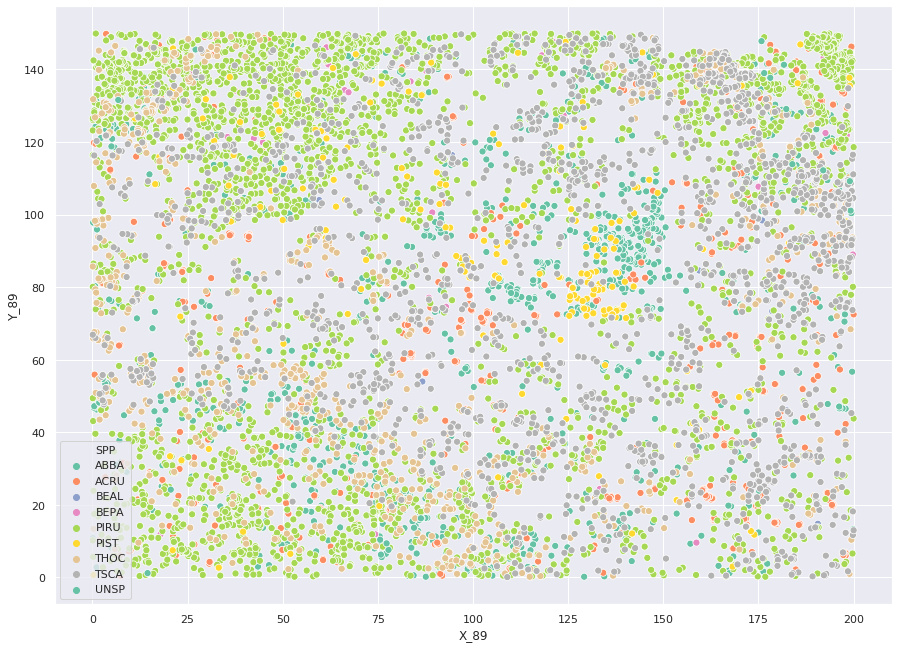

In [6]:
sns.set()
fig, ax = plt.subplots(figsize=(15,11))
ax = sns.scatterplot(x="X_89", y="Y_89",
                     hue="SPP",# size="DBH_15",
                     palette='Set2', s=50,
                     data=npt)
fig.savefig('./paper/figures/Eplot_TreeMap_bySpecies.png', bbox_inches='tight')

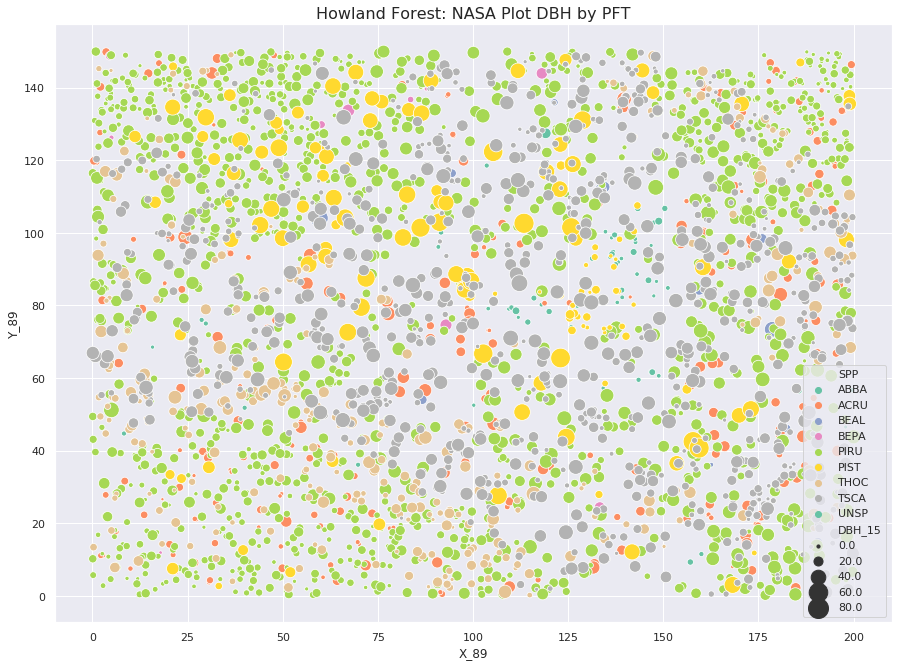

In [7]:
sns.set()
fig, ax = plt.subplots(figsize=(15,11))
ax = sns.scatterplot(x="X_89", y="Y_89",
                     hue="SPP", size="DBH_15",
                     palette='Set2', sizes=(10, 400),
                     data=npt)
ax.set_title("Howland Forest: NASA Plot DBH by PFT", fontsize=16)

fig.savefig('./paper/figures/Eplot_TreeMap_bySpecies_byDBH.png', bbox_inches='tight')

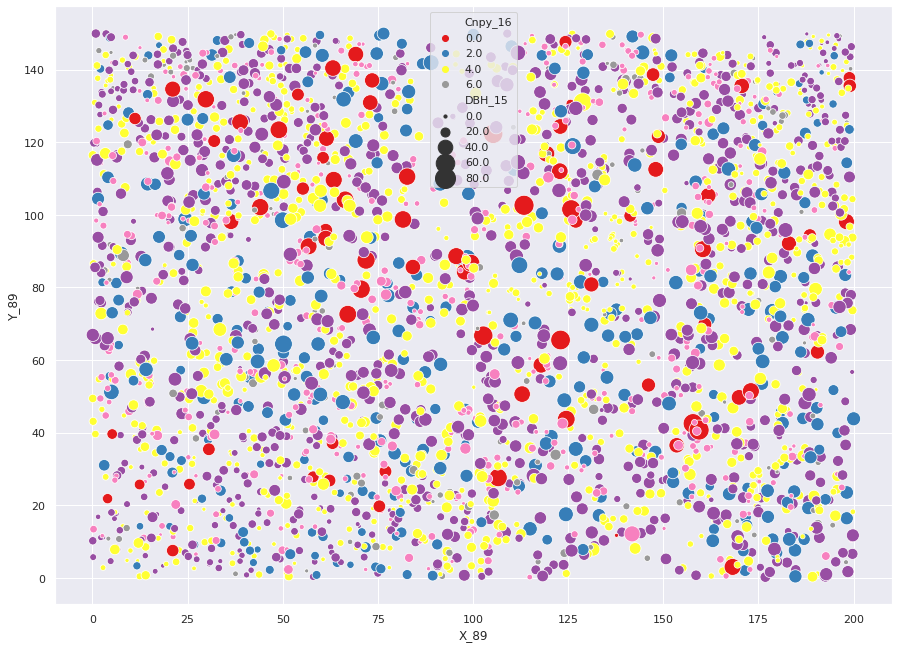

In [8]:
sns.set()
fig, ax = plt.subplots(figsize=(15,11))
ax = sns.scatterplot(x="X_89", y="Y_89",
                     hue="Cnpy_16", size="DBH_15",
                     palette='Set1', sizes=(10, 400),
                     data=npt)
fig.savefig('./paper/figures/Eplot_TreeMap_byCnpy_byDBH.png', bbox_inches='tight')

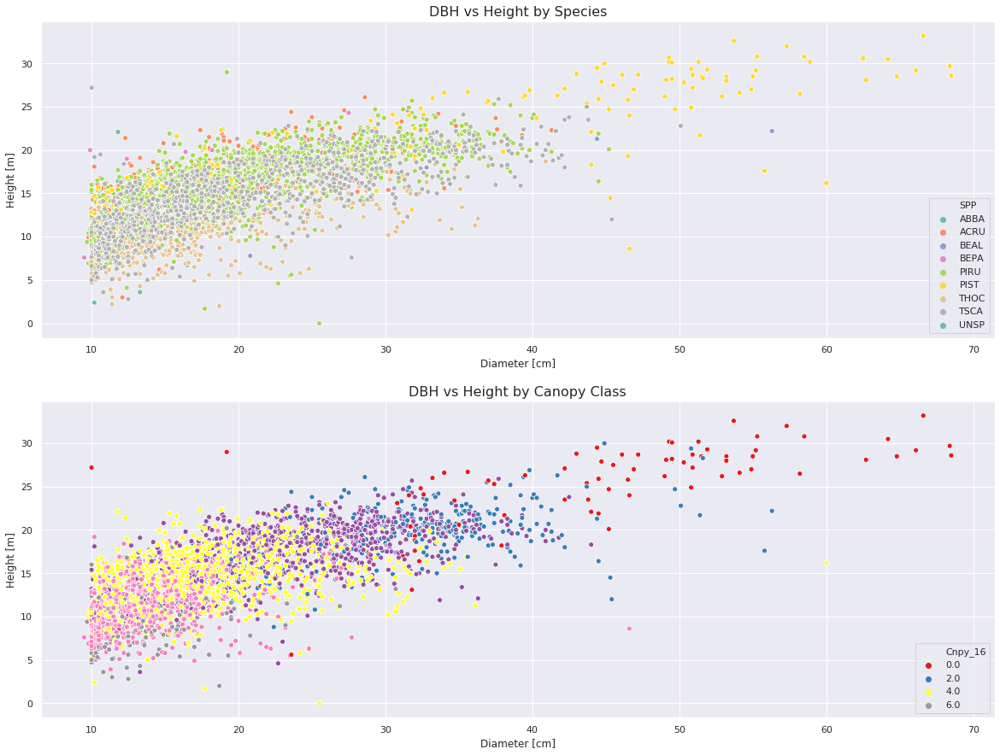

In [9]:
f,ax = plt.subplots(2,1,figsize=(20,15))

sns.scatterplot(x='DBH_15',y='Ht_16', data=npt, hue='SPP', palette='Set2', ax=ax[0])
ax[0].set_title("DBH vs Height by Species", fontsize=16)
ax[0].set(xlabel='Diameter [cm]', ylabel='Height [m]')

sns.scatterplot(x='DBH_15',y='Ht_16', data=npt, hue='Cnpy_16', palette='Set1', ax=ax[1])
ax[1].set_title("DBH vs Height by Canopy Class", fontsize=16)
ax[1].set(xlabel='Diameter [cm]', ylabel='Height [m]')

f.savefig('./paper/figures/Eplot_Scatter_Height_vs_DBH_by_Cnpy&Species.png', bbox_inches='tight')

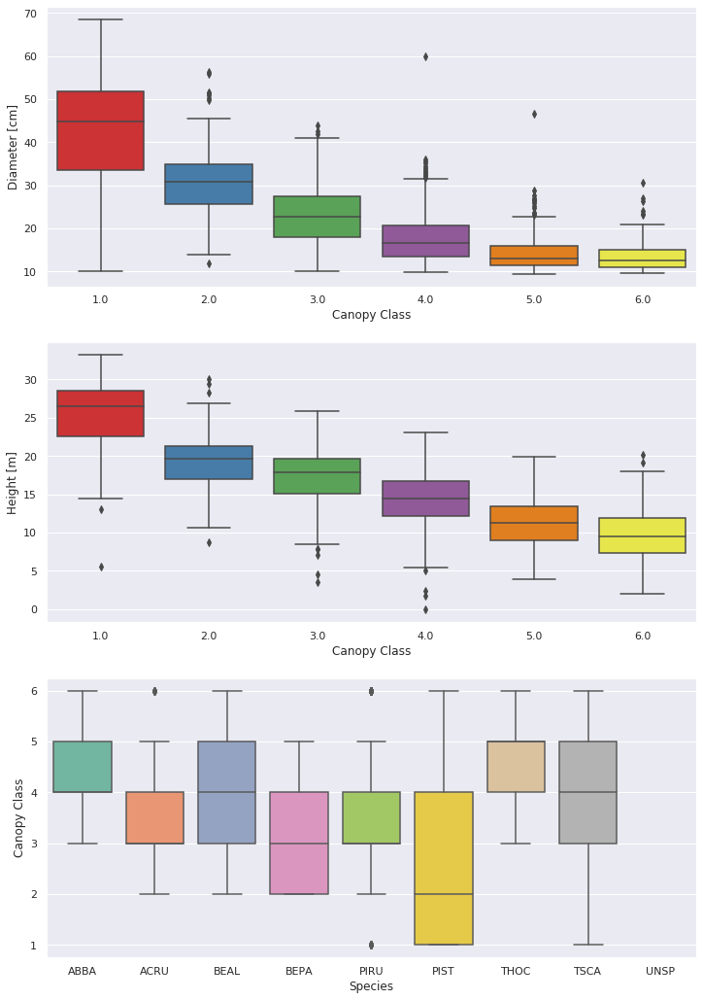

In [10]:
f,ax = plt.subplots(3,1,figsize=(12,18))

#ax = sns.boxplot(x='Cnpy_16',y='DBH_15', data=npt)
sns.boxplot(x='Cnpy_16',y='DBH_15', data=npt, ax=ax[0], palette='Set1')
ax[0].set(xlabel='Canopy Class', ylabel='Diameter [cm]')

sns.boxplot(x='Cnpy_16',y='Ht_16', data=npt, ax=ax[1], palette='Set1')
ax[1].set(xlabel='Canopy Class', ylabel='Height [m]')

sns.boxplot(x='SPP',y='Cnpy_16', data=npt, ax=ax[2], palette='Set2')
ax[2].set(xlabel='Species', ylabel='Canopy Class')


f.savefig('./paper/figures/Eplot_Boxplot_Cnpy_vs_Height&DBH.png', bbox_inches='tight')

In [11]:
np16 = npt[['SPP','PFT','Ht_16', 'DBH_15','Cnpy_16','BLC_16','TNSCT','tnsct_val','X_89','Y_89','geometry']]
np16 = np16.dropna()

# change transect value to integer
np16['tnsct_val'] = np16['tnsct_val'].astype('int')

In [12]:
# variables to use in model
vars16 = ['DBH_15', 'Ht_16', 'BLC_16']

# run model
m16 = spreg.OLS(np16[['Cnpy_16']].values, np16[vars16].values, name_y='Cnpy_16', name_x=vars16)

print(m16.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :     Cnpy_16                Number of Observations:        2989
Mean dependent var  :      3.6895                Number of Variables   :           4
S.D. dependent var  :      1.1313                Degrees of Freedom    :        2985
R-squared           :      0.5372
Adjusted R-squared  :      0.5367
Sum squared residual:    1769.679                F-statistic           :   1154.9730
Sigma-square        :       0.593                Prob(F-statistic)     :           0
S.E. of regression  :       0.770                Log likelihood        :   -3457.879
Sigma-square ML     :       0.592                Akaike info criterion :    6923.759
S.E of regression ML:      0.7695                Schwarz criterion     :    6947.769

-----------------------------------------------------------------------------

In [13]:
np16['ols_residual'] = m16.u

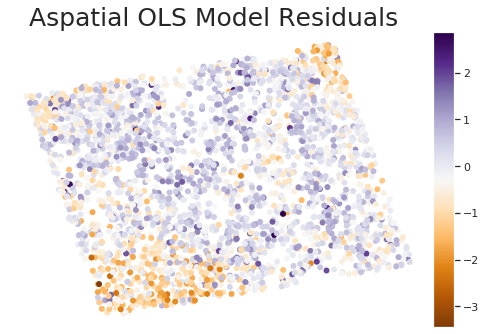

In [14]:
# create figure and axes
f,ax = plt.subplots(1,1,figsize=(8,8))

# create map
np16.plot('ols_residual', ax=ax, cmap='PuOr', linewidth=0)
# remove axis
ax.axis('off')

# add a title
ax.set_title('Aspatial OLS Model Residuals ', \
              fontdict={'fontsize': '25',
                        'fontweight' : '3'})

r_min = np16['ols_residual'].values.min()
r_max = np16['ols_residual'].values.max()

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

# add legend
sm = plt.cm.ScalarMappable(cmap='PuOr', norm=plt.Normalize(vmin=r_min, vmax=r_max))
sm._A = []
cbar = f.colorbar(sm, cax=cax)

f.savefig('./paper/figures/OLS_mod_residuals_map.png', bbox_inches='tight')

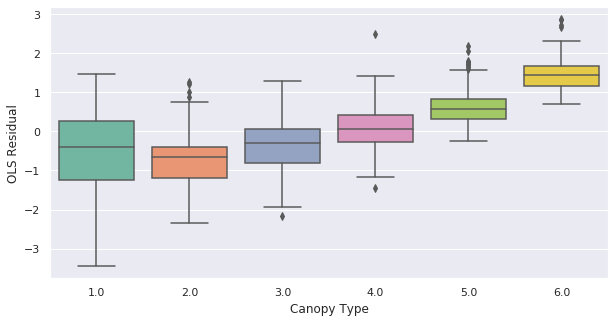

In [15]:
f,ax = plt.subplots(1,figsize=(10,5))

sns.boxplot(x='Cnpy_16',y='ols_residual', data=np16, ax=ax, palette='Set2')
ax.set(xlabel='Canopy Type', ylabel='OLS Residual')

f.savefig('./paper/figures/OLS_mod_residuals_by_Canopy.png', bbox_inches='tight')

In [16]:
var = np16['ols_residual']
knn = weights.KNN.from_dataframe(np16, k=10)
lag = lp.weights.lag_spatial(knn, var)
mi = esda.moran.Moran(var, knn)
print(mi.I,mi.p_sim)

0.2519757209655587 0.001


Text(0.5, 0, "Moran's I")

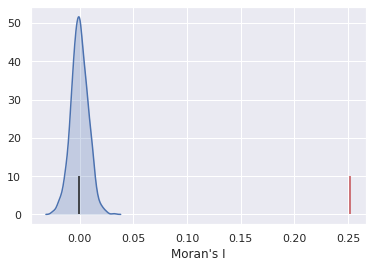

In [17]:
sns.kdeplot(mi.sim, shade=True)
plt.vlines(mi.I, 0, 10, color='r')
plt.vlines(mi.EI, 0,10)
plt.xlabel("Moran's I")

In [18]:
# spatial fixed effects by transcript
np16['tnsct_val'] = np16['tnsct_val'].astype(str)
fe_t = 'Cnpy_16 ~ ' + ' + '.join(vars16) + ' + tnsct_val - 1'
print(fe_t)

Cnpy_16 ~ DBH_15 + Ht_16 + BLC_16 + tnsct_val - 1


In [19]:
# fixed effects by transect
m16_fe_t = smf.ols(fe_t, data=np16).fit()
print(m16_fe_t.summary2())

                  Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.699     
Dependent Variable: Cnpy_16          AIC:                6419.7785 
Date:               2019-12-16 22:44 BIC:                12530.5212
No. Observations:   2989             Log-Likelihood:     -2191.9   
Df Model:           1017             F-statistic:        7.831     
Df Residuals:       1971             Prob (F-statistic): 0.00      
R-squared:          0.802            Scale:              0.38487   
-------------------------------------------------------------------
                    Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-------------------------------------------------------------------
tnsct_val[1005]     6.8830   0.2802  24.5681 0.0000  6.3336  7.4324
tnsct_val[1006]     6.8663   0.3135  21.8989 0.0000  6.2514  7.4812
tnsct_val[1009]     7.2193   0.4430  16.2978 0.0000  6.3506  8.0880
tnsct_val[101]      7.4352   0.3199  23.2430 0.0000  6.8079  8.062

In [21]:
# check residuals spatial autocorrelation
np16['m1_residual'] = m16_fe_t.resid
m16r = np16['m1_residual']

c16 = np16['Cnpy_16'].astype(int)
knn = weights.KNN.from_dataframe(np16, k=10)
c16_lag = weights.spatial_lag.lag_spatial(knn, c16)

m1r_mi = esda.moran.Moran(m16r, knn)
print(m1r_mi.I,m1r_mi.p_sim)

-0.08922855971993054 0.001


Text(0.5, 0, "Moran's I")

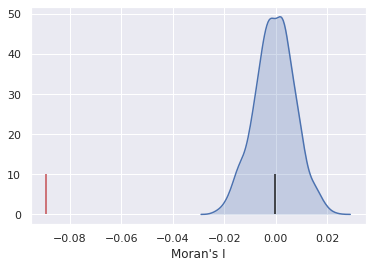

In [23]:
sns.kdeplot(m1r_mi.sim, shade=True)
plt.vlines(m1r_mi.I, 0, 10, color='r')
plt.vlines(m1r_mi.EI, 0,10)
plt.xlabel("Moran's I")

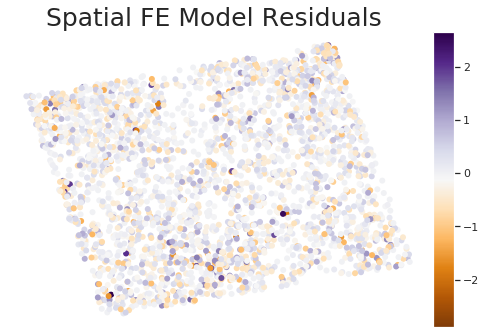

In [24]:
# create figure and axes
f,ax = plt.subplots(1,1,figsize=(8,8))

# create map
np16.plot('m1_residual', ax=ax, cmap='PuOr', linewidth=0)
# remove axis
ax.axis('off')

# add a title
ax.set_title('Spatial FE Model Residuals ', \
              fontdict={'fontsize': '25',
                        'fontweight' : '3'})

r_min = np16['m1_residual'].values.min()
r_max = np16['m1_residual'].values.max()

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

# add legend
sm = plt.cm.ScalarMappable(cmap='PuOr', norm=plt.Normalize(vmin=r_min, vmax=r_max))
sm._A = []
cbar = f.colorbar(sm, cax=cax)

f.savefig('./paper/figures/SFE_mod_residuals_map.png', bbox_inches='tight')

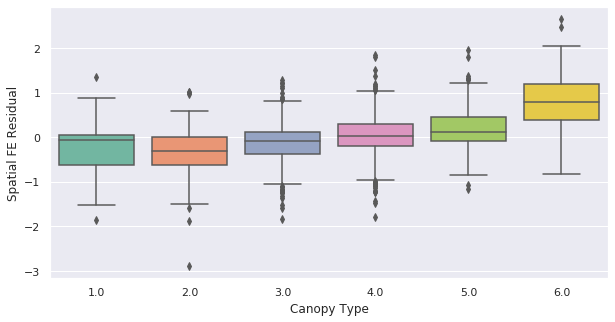

In [25]:
f,ax = plt.subplots(1,figsize=(10,5))

sns.boxplot(x='Cnpy_16',y='m1_residual', data=np16, ax=ax, palette='Set2')
ax.set(xlabel='Canopy Type', ylabel='Spatial FE Residual')

f.savefig('./paper/figures/SFE_mod_residuals_by_Canopy.png', bbox_inches='tight')

In [26]:
# get coefficients for each transect
coeffs = m16_fe_t.params
# coeffs

# ESDA - Spatial Autocorrelation of variables

In [27]:
from pysal.explore import esda
from pysal.viz.splot import esda as esdaplot
import seaborn as sbn

In [28]:
# read in transects
ts = gpd.read_file('./data/shapefiles/nasa_plot_tnsct.shp')
ts = ts.dropna()
ts['Cnpy_16'] = ts['Cnpy_16'].fillna(0)

In [29]:
wq =  lp.weights.Queen.from_dataframe(ts)
wq.transform = 'r'

('WARNING: ', 23, ' is an island (no neighbors)')
('WARNING: ', 162, ' is an island (no neighbors)')
('WARNING: ', 163, ' is an island (no neighbors)')
('WARNING: ', 551, ' is an island (no neighbors)')
('WARNING: ', 579, ' is an island (no neighbors)')
('WARNING: ', 1024, ' is an island (no neighbors)')
('WARNING: ', 1025, ' is an island (no neighbors)')


/opt/conda/lib/python3.7/site-packages/pysal/lib/weights/weights.py:168: UserWarning: There are 7 disconnected observations 
  Island ids: 23, 162, 163, 551, 579, 1024, 1025
  " Island ids: %s" % ', '.join(str(island) for island in self.islands))


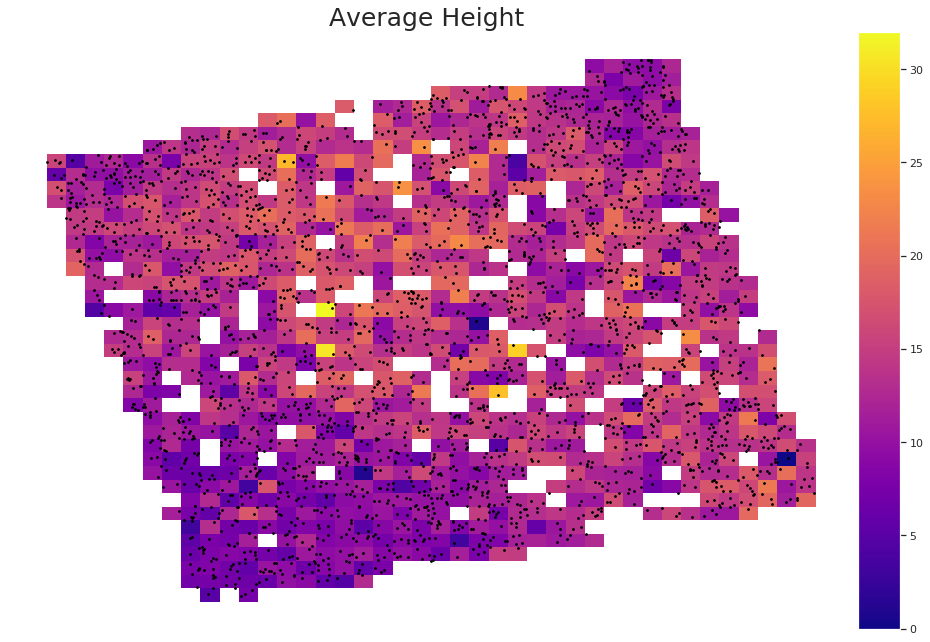

In [30]:
# create figure and axes
f,ax = plt.subplots(1,1,figsize=(16,16))

# plot transects
ts.plot('Ht_16',ax=ax, cmap='plasma', linewidth=1, edgecolor='none')
ax.axis('off')

# add tree locations
np16.plot(ax=ax, color='black', markersize=3);

# add a title and legend
ax.set_title('Average Height ', fontdict={'fontsize': '25','fontweight' : '3'})
r_min = ts['Ht_16'].values.min()
r_max = ts['Ht_16'].values.max()

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=0, vmax=r_max))
sm._A = []
cbar = f.colorbar(sm, cax=cax)

f.savefig('./paper/figures/ESDA_height.png', bbox_inches='tight')

In [31]:
# Height
var = ts['Ht_16']
lag = lp.weights.lag_spatial(wq, var)
mi = esda.moran.Moran(var, wq)
print(mi.I,mi.p_sim)

0.3550335299981497 0.001


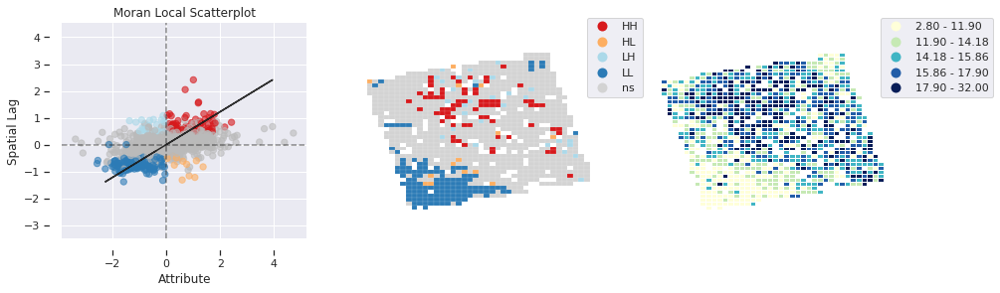

In [32]:
lisa = esda.Moran_Local(ts["Ht_16"], wq)
esdaplot.plot_local_autocorrelation(lisa, ts, "Ht_16");

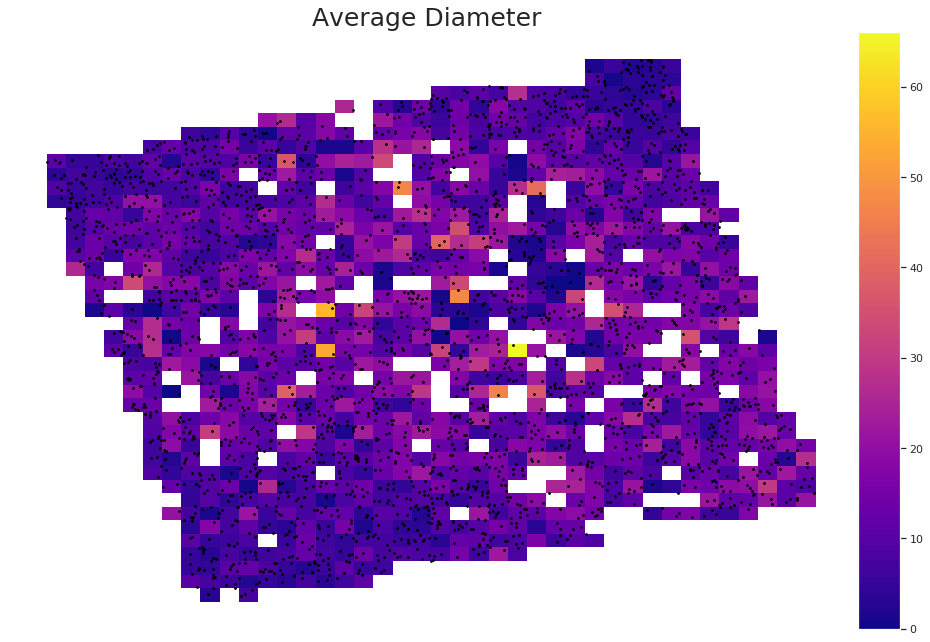

In [33]:
# create figure and axes
f,ax = plt.subplots(1,1,figsize=(16,16))

# plot transects
ts.plot('DBH_15',ax=ax, cmap='plasma', linewidth=1, edgecolor='none')
ax.axis('off')

# add tree locations
np16.plot(ax=ax, color='black', markersize=3);

# add a title and legend
ax.set_title('Average Diameter ', fontdict={'fontsize': '25','fontweight' : '3'})
r_min = ts['DBH_15'].values.min()
r_max = ts['DBH_15'].values.max()

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=0, vmax=r_max))
sm._A = []
cbar = f.colorbar(sm, cax=cax)

f.savefig('./paper/figures/ESDA_dbh.png', bbox_inches='tight')

In [34]:
# Diameter
var = ts['DBH_15']
lag = lp.weights.lag_spatial(wq, var)
mi = esda.moran.Moran(var, wq)
print(mi.I,mi.p_sim)

0.1989449088566575 0.001


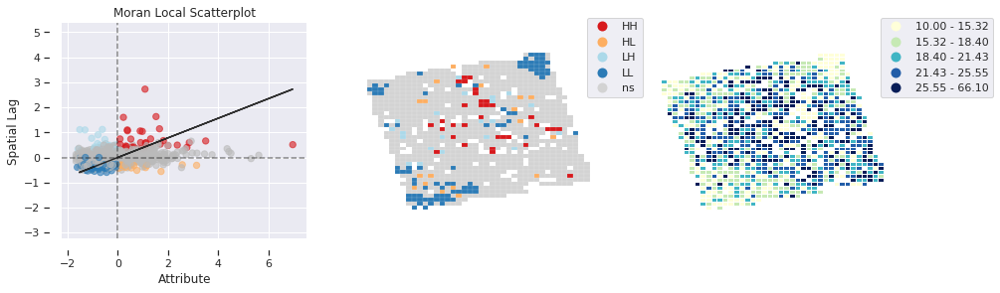

In [35]:
lisa = esda.Moran_Local(ts["DBH_15"], wq)
esdaplot.plot_local_autocorrelation(lisa, ts, "DBH_15");

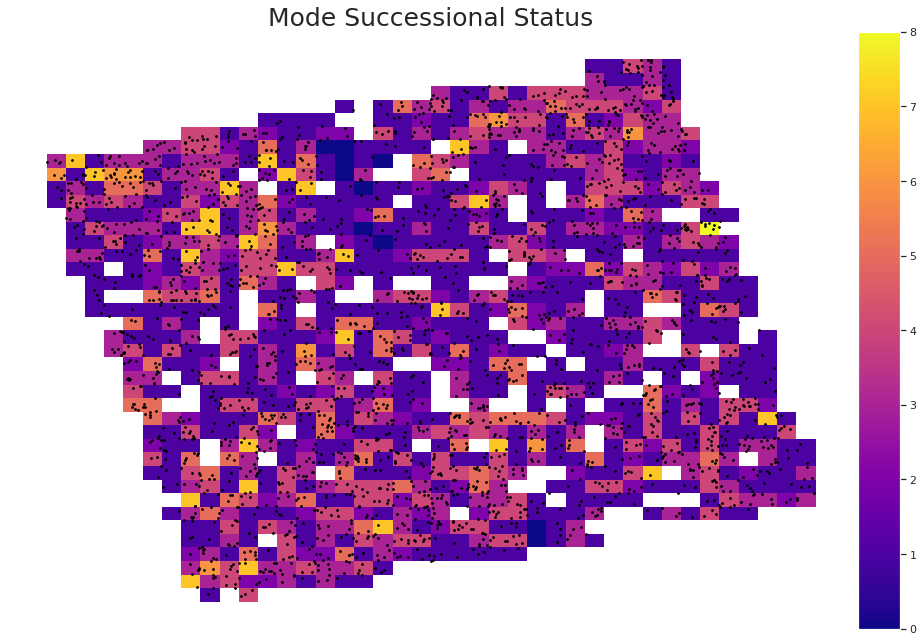

In [36]:
# create figure and axes
f,ax = plt.subplots(1,1,figsize=(16,16))

# plot transects
ts.plot('Cnpy_16',ax=ax, cmap='plasma', linewidth=1, edgecolor='none')
ax.axis('off')

# add tree locations
np16.plot(ax=ax, color='black', markersize=3);

# add a title and legend
ax.set_title('Mode Successional Status', fontdict={'fontsize': '25','fontweight' : '3'})
r_min = ts['Cnpy_16'].values.min()
r_max = ts['Cnpy_16'].values.max()

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=0, vmax=r_max))
sm._A = []
cbar = f.colorbar(sm, cax=cax)

f.savefig('./paper/figures/ESDA_cnpy.png', bbox_inches='tight')

In [37]:
# Height
var = ts['Cnpy_16']
lag = lp.weights.lag_spatial(wq, var)
mi = esda.moran.Moran(var, wq)
print(mi.I,mi.p_sim)

0.08316424064537922 0.001


/opt/conda/lib/python3.7/site-packages/mapclassify/classifiers.py:138: UserWarning: Warning: Not enough unique values in array to form k classes
  "Warning: Not enough unique values in array to form k classes", UserWarning
/opt/conda/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)


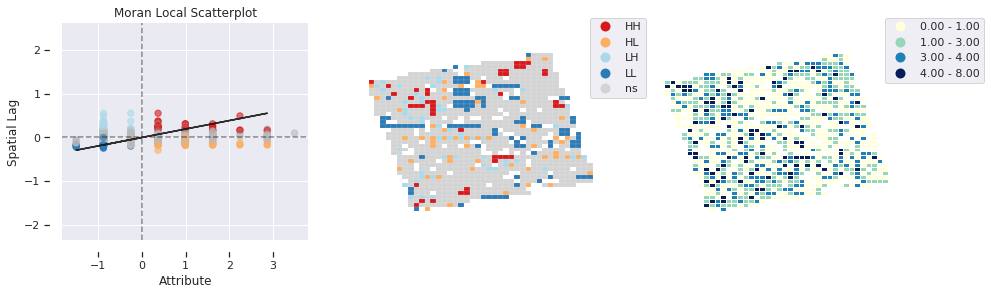

In [38]:
lisa = esda.Moran_Local(ts["Cnpy_16"], wq)
esdaplot.plot_local_autocorrelation(lisa, ts, "Cnpy_16");

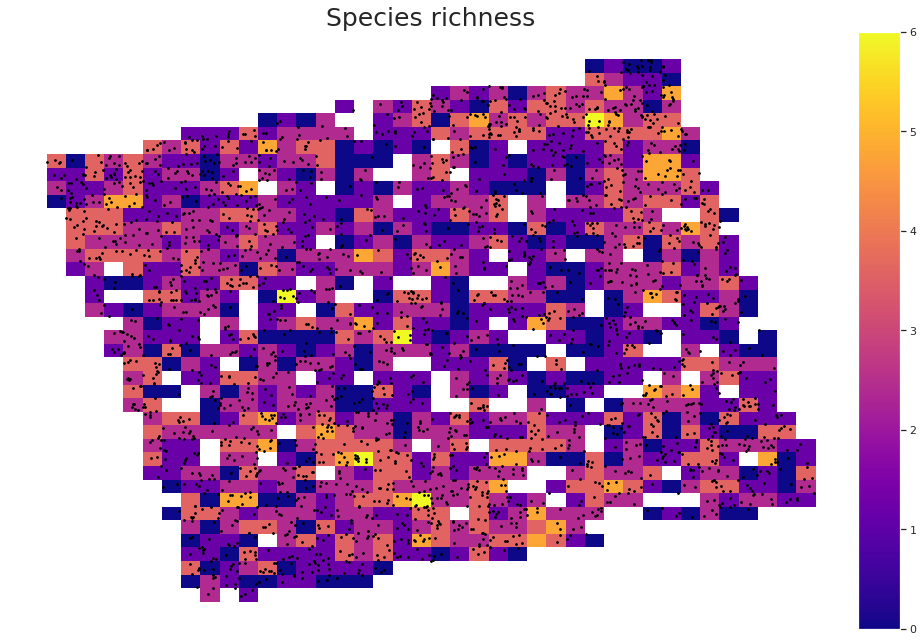

In [39]:
# create figure and axes
f,ax = plt.subplots(1,1,figsize=(16,16))

# plot transects
ts.plot('nSpecies',ax=ax, cmap='plasma', linewidth=1, edgecolor='none')
ax.axis('off')

# add tree locations
np16.plot(ax=ax, color='black', markersize=3);

# add a title and legend
ax.set_title('Species richness', fontdict={'fontsize': '25','fontweight' : '3'})
r_min = ts['nSpecies'].values.min()
r_max = ts['nSpecies'].values.max()

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=0, vmax=r_max))
sm._A = []
cbar = f.colorbar(sm, cax=cax)

f.savefig('./paper/figures/ESDA_richness.png', bbox_inches='tight')

In [40]:
# Species richness
var = ts['nSpecies']
lag = lp.weights.lag_spatial(wq, var)
mi = esda.moran.Moran(var, wq)
print(mi.I,mi.p_sim)

0.17209190320530765 0.001


/opt/conda/lib/python3.7/site-packages/mapclassify/classifiers.py:138: UserWarning: Warning: Not enough unique values in array to form k classes
  "Warning: Not enough unique values in array to form k classes", UserWarning
/opt/conda/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)


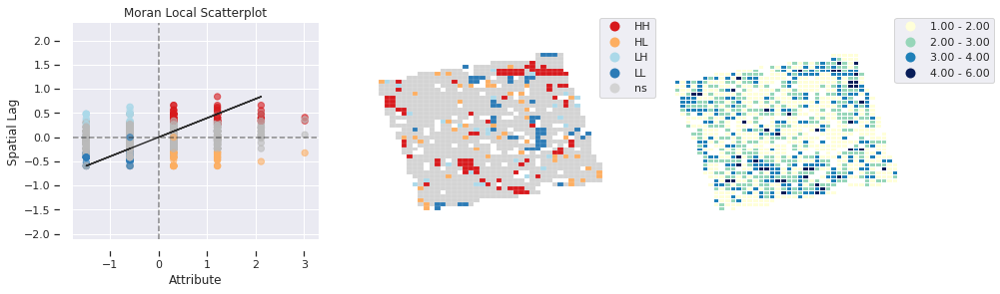

In [41]:
lisa = esda.Moran_Local(ts["nSpecies"], wq)
esdaplot.plot_local_autocorrelation(lisa, ts, "nSpecies");

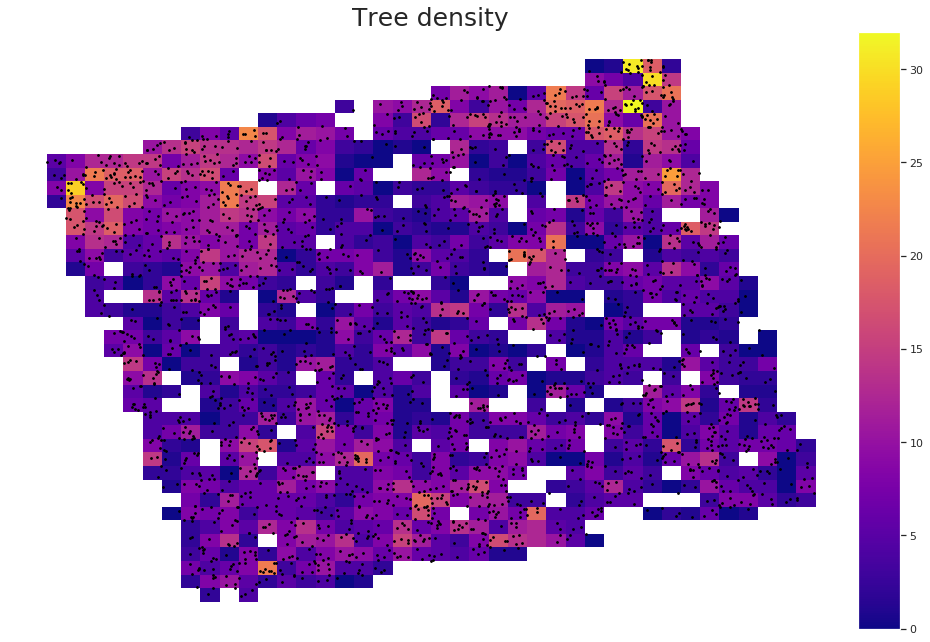

In [42]:
# create figure and axes
f,ax = plt.subplots(1,1,figsize=(16,16))

# plot transects
ts.plot('nTrees',ax=ax, cmap='plasma', linewidth=1, edgecolor='none')
ax.axis('off')

# add tree locations
np16.plot(ax=ax, color='black', markersize=3);

# add a title and legend
ax.set_title('Tree density', fontdict={'fontsize': '25','fontweight' : '3'})
r_min = ts['nTrees'].values.min()
r_max = ts['nTrees'].values.max()

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=0, vmax=r_max))
sm._A = []
cbar = f.colorbar(sm, cax=cax)

f.savefig('./paper/figures/ESDA_density.png', bbox_inches='tight')

In [43]:
# Tree Density
var = ts['nTrees']
lag = lp.weights.lag_spatial(wq, var)
mi = esda.moran.Moran(var, wq)
print(mi.I,mi.p_sim)

0.3671638094880763 0.001


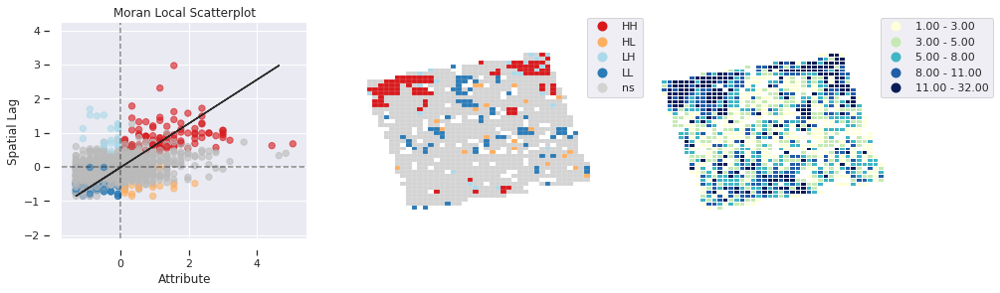

In [44]:
lisa = esda.Moran_Local(ts["nTrees"], wq)
esdaplot.plot_local_autocorrelation(lisa, ts, "nTrees");

In [45]:
# spatial heterogeneity index
ts['shi'] = ts['nSpecies'] / ts['nTrees']

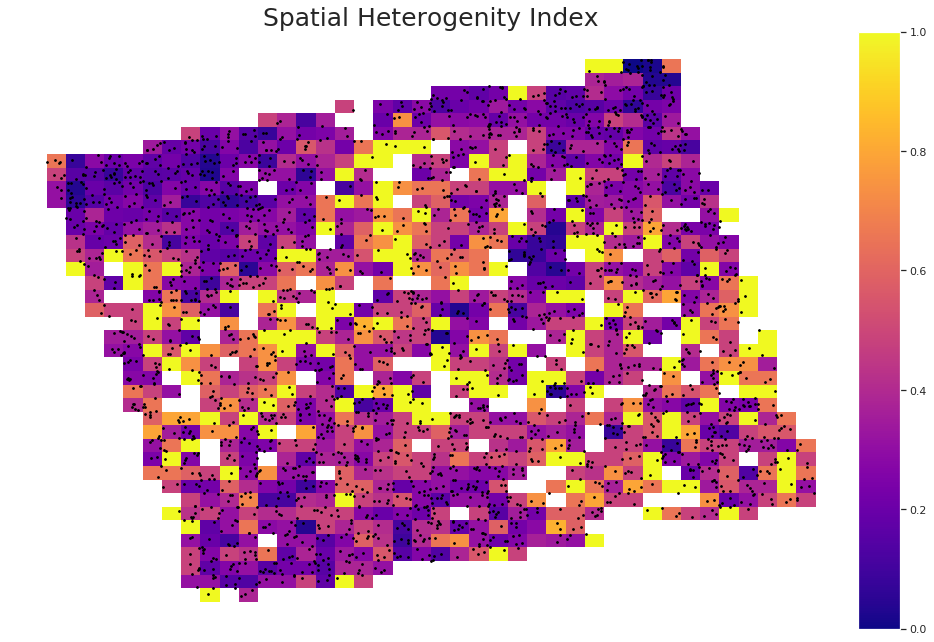

In [46]:
# create figure and axes
f,ax = plt.subplots(1,1,figsize=(16,16))

# plot transects
ts.plot('shi',ax=ax, cmap='plasma', linewidth=1, edgecolor='none')
ax.axis('off')

# add tree locations
np16.plot(ax=ax, color='black', markersize=3);

# add a title and legend
ax.set_title('Spatial Heterogenity Index', fontdict={'fontsize': '25','fontweight' : '3'})
r_min = ts['shi'].values.min()
r_max = ts['shi'].values.max()

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=0, vmax=r_max))
sm._A = []
cbar = f.colorbar(sm, cax=cax)

f.savefig('./paper/figures/ESDA_shi.png', bbox_inches='tight')

In [47]:
# SHI
var = ts['shi']
lag = lp.weights.lag_spatial(wq, var)
mi = esda.moran.Moran(var, wq)
print(mi.I,mi.p_sim)

0.24865228760194794 0.001


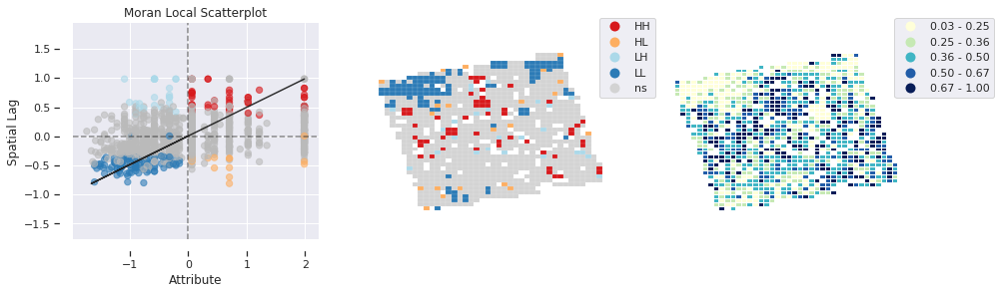

In [48]:
lisa = esda.Moran_Local(ts["shi"], wq)
esdaplot.plot_local_autocorrelation(lisa, ts, "shi");

# Geographically Weighted Regression

In [62]:
import numpy as np
import pandas as pd
from pysal.lib import examples as ps
from pysal.model.mgwr.gwr import GWR, MGWR
from pysal.model.mgwr.sel_bw import Sel_BW
import geopandas as gp
import matplotlib.pyplot as plt
import matplotlib as mpl

def compare(data, var1, var2, gwr_t, gwr_bw, mgwr_t, mgwr_bw, name, kwargs1, kwargs2):
    
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(45,20))
    ax0 = axes[0]
    ax0.set_title('GWR ' + name + ' Surface (BW: ' + str(gwr_bw) +')', fontsize=40)
    ax1 = axes[1]
    ax1.set_title('MGWR ' + name + ' Surface (BW: ' + str(mgwr_bw) +')', fontsize=40)

    #Set color map
    cmap = plt.cm.seismic

    #Find min and max values of the two combined datasets
    gwr_min = data[var1].min()
    gwr_max = data[var1].max()
    mgwr_min = data[var2].min()
    mgwr_max = data[var2].max()
    vmin = np.min([gwr_min, mgwr_min])
    vmax = np.max([gwr_max, mgwr_max])

    #If all values are negative use the negative half of the colormap
    if (vmin < 0) & (vmax < 0):
        cmap = truncate_colormap(cmap, 0.0, 0.5)
    #If all values are positive use the positive half of the colormap
    elif (vmin > 0) & (vmax > 0):
        cmap = truncate_colormap(cmap, 0.5, 1.0)
    #Otherwise, there are positive and negative values so the colormap so zero is the midpoint
    else:
        cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

    #Create scalar mappable for colorbar and stretch colormap across range of data values
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

    #Plot GWR parameters
    data.plot(var1, cmap=sm.cmap, ax=ax0, vmin=vmin, vmax=vmax, **kwargs1)
    if (gwr_t == 0).any():
        data[gwr_t == 0].plot(color='lightgrey', ax=ax0, **kwargs2)

    #Plot MGWR parameters
    data.plot(var2, cmap=sm.cmap, ax=ax1, vmin=vmin, vmax=vmax, **kwargs1)
    if (mgwr_t == 0).any():
        data[mgwr_t == 0].plot(color='lightgrey', ax=ax1, **kwargs2)

    #Set figure options and plot 
    fig.tight_layout()    
    fig.subplots_adjust(right=0.9)
    cax = fig.add_axes([0.92, 0.14, 0.03, 0.75])
    sm._A = []
    cbar = fig.colorbar(sm, cax=cax)
    cbar.ax.tick_params(labelsize=50) 
    ax0.get_xaxis().set_visible(False)
    ax0.get_yaxis().set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    plt.show()
    
    fig.savefig('./paper/figures/GWR_dbh.png', bbox_inches='tight')
    
#Utility function #1 - forces diverging colormap to be centered at zero
def shift_colormap(cmap, start=0, midpoint=0.5, stop=1.0, name='shiftedcmap'):
    '''
    Function to offset the "center" of a colormap. Useful for
    data with a negative min and positive max and you want the
    middle of the colormap's dynamic range to be at zero

    Parameters
    -----
      cmap : The matplotlib colormap to be altered
      start : Offset from lowest point in the colormap's range.
          Defaults to 0.0 (no lower ofset). Should be between
          0.0 and `midpoint`.
      midpoint : The new center of the colormap. Defaults to 
          0.5 (no shift). Should be between 0.0 and 1.0. In
          general, this should be  1 - vmax/(vmax + abs(vmin))
          For example if your data range from -15.0 to +5.0 and
          you want the center of the colormap at 0.0, `midpoint`
          should be set to  1 - 5/(5 + 15)) or 0.75
      stop : Offset from highets point in the colormap's range.
          Defaults to 1.0 (no upper ofset). Should be between
          `midpoint` and 1.0.
    
    Returns
    -------
    new_cmap : A new colormap that has been shifted. 
    '''
    
    cdict = {
        'red': [],
        'green': [],
        'blue': [],
        'alpha': []
    }

    # regular index to compute the colors
    reg_index = np.linspace(start, stop, 257)

    # shifted index to match the data
    shift_index = np.hstack([
        np.linspace(0.0, midpoint, 128, endpoint=False), 
        np.linspace(midpoint, 1.0, 129, endpoint=True)
    ])

    for ri, si in zip(reg_index, shift_index):
        r, g, b, a = cmap(ri)

        cdict['red'].append((si, r, r))
        cdict['green'].append((si, g, g))
        cdict['blue'].append((si, b, b))
        cdict['alpha'].append((si, a, a))

    new_cmap = mpl.colors.LinearSegmentedColormap(name, cdict)
    plt.register_cmap(cmap=new_cmap)

    return new_cmap

#Utility #2 - truncate colorcap in order to grab only positive or negative portion
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    '''
    Function to truncate a colormap by selecting a subset of the original colormap's values

    Input
    -----
      cmap : Mmatplotlib colormap to be altered
      minval : Minimum value of the original colormap to include in the truncated colormap
      maxval : Maximum value of the original colormap to include in the truncated colormap
      n : Number of intervals between the min and max values for the gradient of the truncated colormap
          
    Returns
    -------
    new_cmap : A new colormap that has been shifted. 
    '''
    new_cmap = mpl.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

In [50]:
# standardize variables
ox = ts[vars16].values
ox = (ox - ox.mean(axis=0)) / ox.std(axis=0)

oy = ts['Cnpy_16'].values.reshape((-1,1))
oy = (oy - oy.mean(axis=0)) / oy.std(axis=0)

In [51]:
cnpy_mod_S = spreg.OLS(oy, ox, name_y='Cnpy_16', name_x=vars16)
print(cnpy_mod_S.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :     Cnpy_16                Number of Observations:        1026
Mean dependent var  :      0.0000                Number of Variables   :           4
S.D. dependent var  :      1.0005                Degrees of Freedom    :        1022
R-squared           :      0.0833
Adjusted R-squared  :      0.0806
Sum squared residual:     940.507                F-statistic           :     30.9670
Sigma-square        :       0.920                Prob(F-statistic)     :   3.661e-19
S.E. of regression  :       0.959                Log likelihood        :   -1411.198
Sigma-square ML     :       0.917                Akaike info criterion :    2830.396
S.E of regression ML:      0.9574                Schwarz criterion     :    2850.129

-----------------------------------------------------------------------------

In [53]:
# Tidy variables
yy = np.log(np16['Cnpy_16'].values.reshape((-1,1)))
xx = np16[['DBH_15', 'Ht_16', 'BLC_16']].values
x = np16['X_89']
y = np16['Y_89']
np_coords = list(zip(x,y))

In [54]:
#Standardize x and y variables
np_X = (xx - xx.mean(axis=0)) / xx.std(axis=0)
np_y = (yy - yy.mean(axis=0)) / yy.std(axis=0)

119.0


[  90.   41.  310. 2215.]


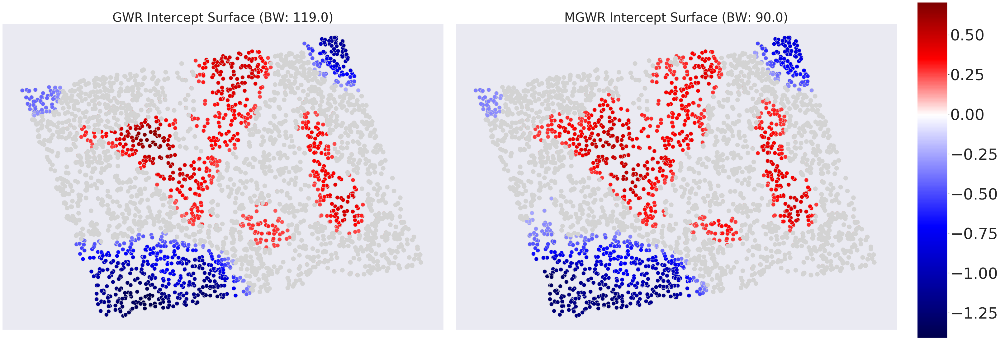

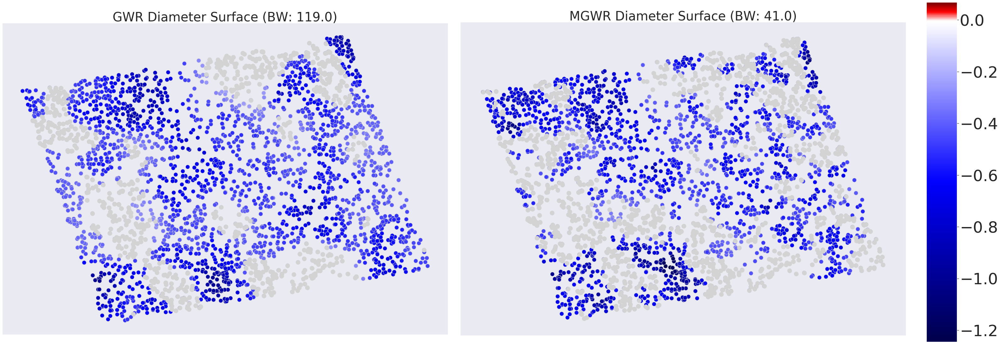

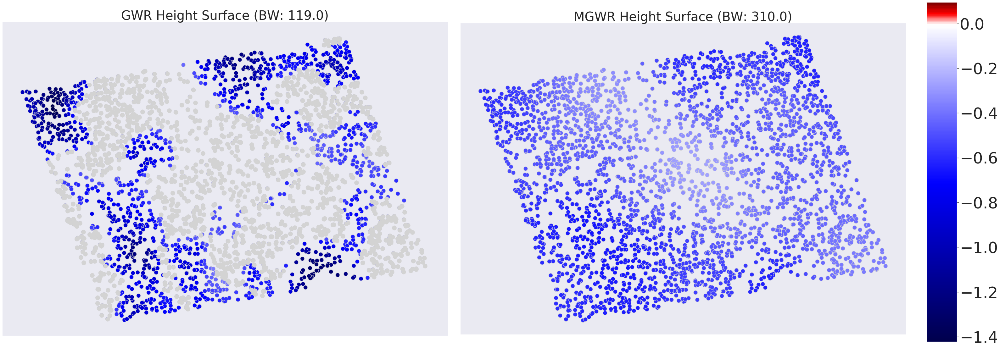

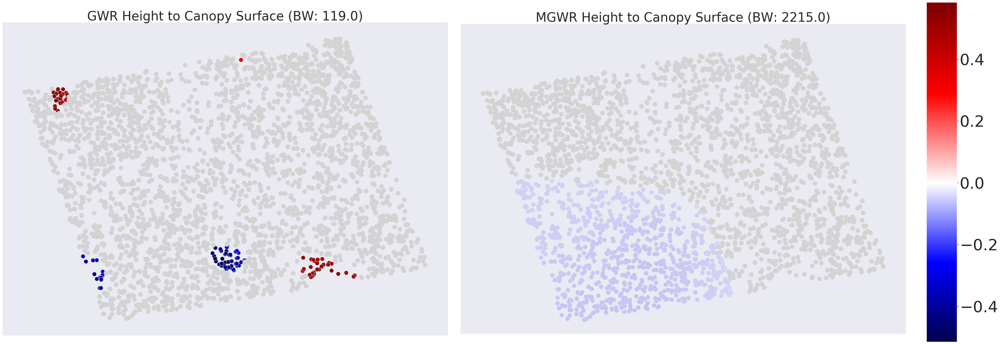

In [55]:
#Calibrate GWR using standardized data

gwr_selector = Sel_BW(np_coords, np_y, np_X)
gwr_bw = gwr_selector.search(bw_min=2)
print(gwr_bw)
gwr_model = GWR(np_coords, np_y, np_X, gwr_bw)
gwr_results = gwr_model.fit()

#Prepare GWR results for mapping

#Add GWR parameters to GeoDataframe
np16['gwr_intercept'] = gwr_results.params[:,0]
np16['gwr_DBH_15'] = gwr_results.params[:,1]
np16['gwr_Ht_16'] = gwr_results.params[:,2]
np16['gwr_BLC_16'] = gwr_results.params[:,3]

#Obtain t-vals filtered based on multiple testing correction
gwr_filtered_t = gwr_results.filter_tvals()

#Calibrate MGWR model

mgwr_selector = Sel_BW(np_coords, np_y, np_X, multi=True)
mgwr_bw = mgwr_selector.search(multi_bw_min=[2])
print(mgwr_bw)
mgwr_results = MGWR(np_coords, np_y, np_X, mgwr_selector).fit()

#Prepare MGWR results for mapping

#Add MGWR parameters to GeoDataframe
np16['mgwr_intercept'] = mgwr_results.params[:,0]
np16['mgwr_DBH_15'] = mgwr_results.params[:,1]
np16['mgwr_Ht_16'] = mgwr_results.params[:,2]
np16['mgwr_BLC_16'] = mgwr_results.params[:,3]

#Obtain t-vals filtered based on multiple testing correction
mgwr_filtered_t = mgwr_results.filter_tvals()

kwargs1 = {'edgecolor':'lightgrey', 'markersize':175}
kwargs2 = {'facecolor':'lightgrey', 'markersize':175}

compare(np16, 'gwr_intercept', 'mgwr_intercept', gwr_filtered_t[:,0],
        gwr_bw, mgwr_filtered_t[:,0], mgwr_bw[0], 'Intercept', kwargs1, kwargs2)

compare(np16, 'gwr_DBH_15', 'mgwr_DBH_15', gwr_filtered_t[:,1], 
        gwr_bw, mgwr_filtered_t[:,1], mgwr_bw[1], 'Diameter', kwargs1, kwargs1)

compare(np16, 'gwr_Ht_16', 'mgwr_Ht_16', gwr_filtered_t[:,2], 
        gwr_bw, mgwr_filtered_t[:,2], mgwr_bw[2], 'Height', kwargs1, kwargs1)

compare(np16, 'gwr_BLC_16', 'mgwr_BLC_16', gwr_filtered_t[:,3],
        gwr_bw, mgwr_filtered_t[:,3], mgwr_bw[3], 'Height to Canopy', kwargs1, kwargs1)

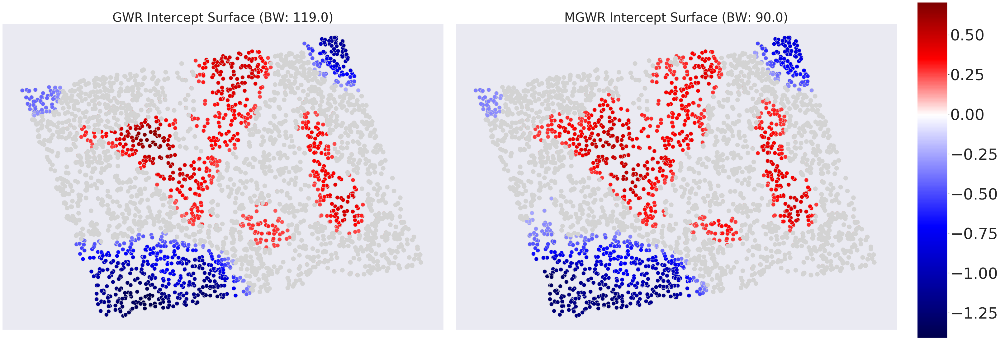

In [59]:
compare(np16, 'gwr_intercept', 'mgwr_intercept', gwr_filtered_t[:,0],
        gwr_bw, mgwr_filtered_t[:,0], mgwr_bw[0], 'Intercept', kwargs1, kwargs2)



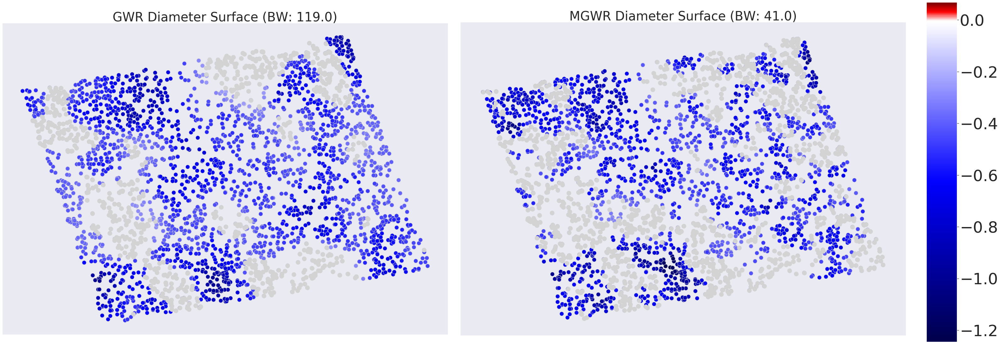

In [63]:
compare(np16, 'gwr_DBH_15', 'mgwr_DBH_15', gwr_filtered_t[:,1], 
        gwr_bw, mgwr_filtered_t[:,1], mgwr_bw[1], 'Diameter', kwargs1, kwargs1)



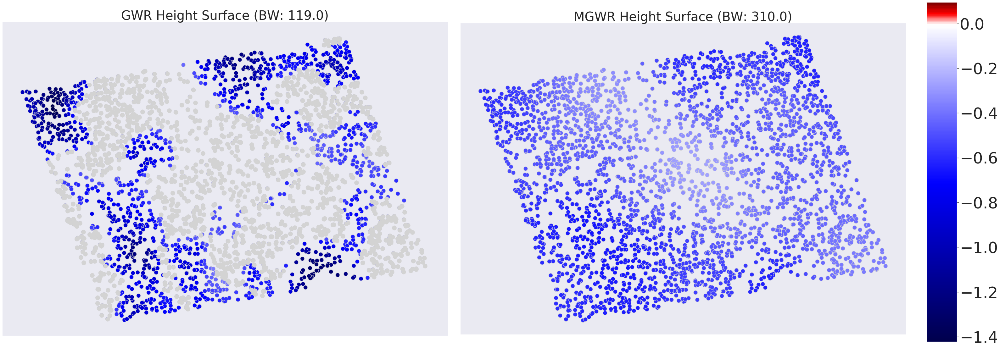

In [61]:
compare(np16, 'gwr_Ht_16', 'mgwr_Ht_16', gwr_filtered_t[:,2], 
        gwr_bw, mgwr_filtered_t[:,2], mgwr_bw[2], 'Height', kwargs1, kwargs1)



In [64]:
# #Prepare GWR/MGWR condition number for mapping
# gwr_lc = gwr_results.local_collinearity()
# mgwr_lc = mgwr_results.local_collinearity()

# np16['gwr_cn'] = gwr_lc[2]
# np16['mgwr_cn'] = mgwr_lc[0]

# fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
# ax0 = axes[0]
# ax0.set_title('GWR Condition Number', fontsize=10)
# ax1 = axes[1]
# ax1.set_title('MGWR Condition Number', fontsize=10)
# cmap = mpl.cm.RdYlBu

# vmin = np.min([np16['gwr_cn'].min(), np16['mgwr_cn'].min()])
# vmax = np.max([np16['gwr_cn'].max(), np16['mgwr_cn'].max()])

# if (vmin < 0) & (vmax < 0):
#     cmap = truncate_colormap(cmap, 0.0, 0.5)
# elif (vmin > 0) & (vmax > 0):
#     cmap = truncate_colormap(cmap, 0.5, 1.0)

# sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

# np16.plot('gwr_cn', cmap=sm.cmap, ax=ax0, vmin=vmin, vmax=vmax,**{'edgecolor':'lightgrey', 'alpha':.95, 'linewidth':.75})
# np16[np16['gwr_cn'] > 30].buffer(700).plot(ax=ax0,**{'facecolor': 'None', 'edgecolor':'black'})
# np16.plot('mgwr_cn', cmap=cmap, ax=ax1, vmin=vmin, vmax=vmax,**{'edgecolor':'lightgrey', 'alpha':.95, 'linewidth':.75})
# np16[np16['gwr_cn'] > 30].buffer(700).plot(ax=ax1,**{'facecolor': 'None', 'edgecolor':'black'})


# fig.tight_layout()    
# fig.subplots_adjust(right=0.9)
# cax = fig.add_axes([0.92, 0.14, 0.03, 0.75])
# sm._A = []
# cbar = fig.colorbar(sm, cax=cax)
# cbar.ax.tick_params(labelsize=10) 
               
# ax0.get_xaxis().set_visible(False)
# ax0.get_yaxis().set_visible(False)
# ax1.get_xaxis().set_visible(False)
# ax1.get_yaxis().set_visible(False)
# plt.show()

Text(0.5, 1.0, 'OLS residuals vs GWR intercept')

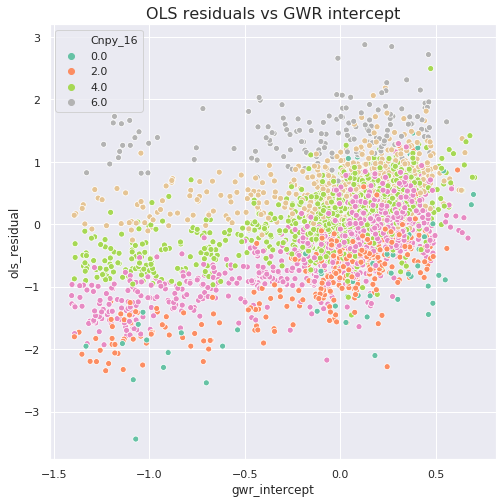

In [65]:
f,ax = plt.subplots(1,1,figsize=(8,8))

sns.scatterplot(y='ols_residual',x='gwr_intercept', data=np16, hue='Cnpy_16', palette='Set2', ax=ax)
ax.set_title("OLS residuals vs GWR intercept", fontsize=16)
# ax.set(xlabel='Diameter [cm]', ylabel='Height [m]')

# f.savefig('./paper/figures/Eplot_Scatter_Height_vs_DBH_by_Cnpy&Species.png', bbox_inches='tight')

In [66]:
from scipy import stats

/opt/conda/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


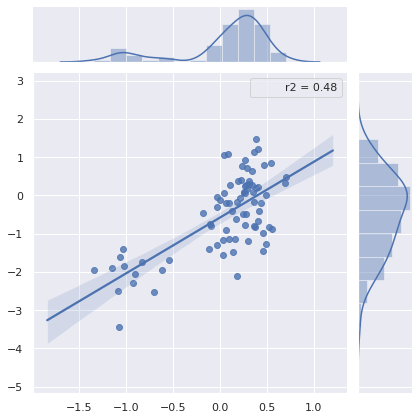

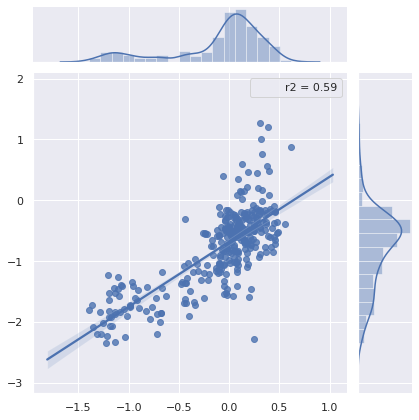

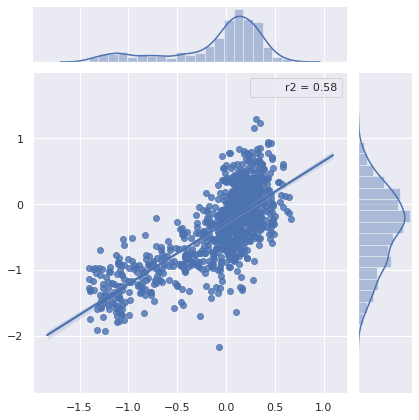

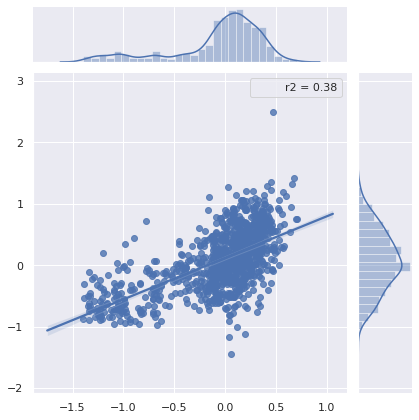

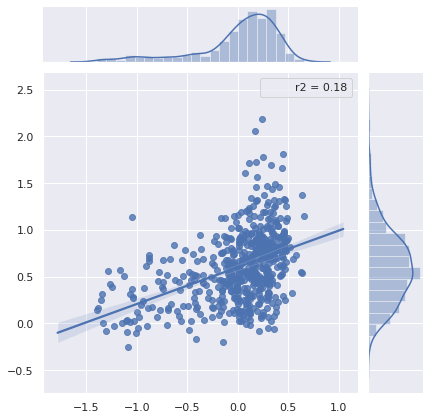

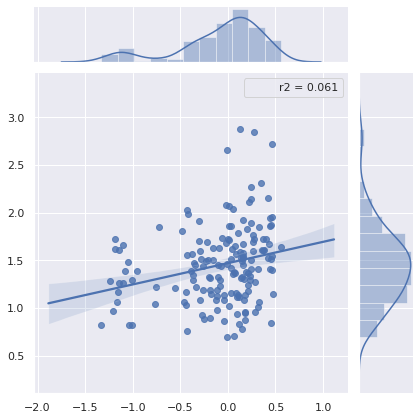

In [67]:
def r2(x, y):
    return stats.pearsonr(x, y)[0] ** 2

for i in range(1, 7):
    
    cnpy_names = ['Super-dominant','Dominant','Co-dominant','Intermediate','Overtopped','Surpressed']
    
    boole = np16['Cnpy_16'] == i
    tmp = np16[boole]

    x = tmp['gwr_intercept'].values
    y = tmp['ols_residual'].values


    f = sns.jointplot(x, y, kind="reg", stat_func=r2)
    pname = './paper/figures/ModelComparison_Cnpy=' + str(i) + '.png'

    f.savefig(pname, bbox_inches='tight')
    